In [1]:
import tensorflow as tf
from __future__ import absolute_import, division, print_function, unicode_literals
from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
import matplotlib.pyplot as plt

tf.config.experimental.set_visible_devices([], 'GPU')

Будем использовать датасет caltech_birds2010

In [2]:
ds_names = ( 'caltech_birds2010:0.1.1',)
dataset_all, info = tfds.load(ds_names[0], split = ['train[:10%]','test[-10%:]'], with_info=True)

In [3]:
info

tfds.core.DatasetInfo(
    name='caltech_birds2010',
    full_name='caltech_birds2010/0.1.1',
    description="""
    Caltech-UCSD Birds 200 (CUB-200) is an image dataset with photos 
    of 200 bird species (mostly North American). The total number of 
    categories of birds is 200 and there are 6033 images in the 2010 
    dataset and 11,788 images in the 2011 dataset.
    Annotations include bounding boxes, segmentation labels.
    """,
    homepage='http://www.vision.caltech.edu/visipedia/CUB-200.html',
    data_path='~\\tensorflow_datasets\\caltech_birds2010\\0.1.1',
    file_format=tfrecord,
    download_size=659.14 MiB,
    dataset_size=659.64 MiB,
    features=FeaturesDict({
        'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=200),
        'label_name': Text(shape=(), dtype=tf.string),

In [4]:
def normalize(input_image, input_mask):
    input_image = tf.cast(input_image, tf.float32) / 255.0
    return input_image, input_mask

In [5]:
@tf.function
def load_image_train(datapoint):
    input_image = tf.image.resize(datapoint['image'], (128, 128))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

    if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

In [6]:
@tf.function
def load_image_test(datapoint):
    input_image = tf.image.resize(datapoint['image'], (128, 128))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128))

    input_image, input_mask = normalize(input_image, input_mask)

    return input_image, input_mask

In [7]:
TRAIN_LENGTH = info.splits['train'].num_examples
BATCH_SIZE = 16
BUFFER_SIZE = 128
STEPS_PER_EPOCH = TRAIN_LENGTH // 10 // BATCH_SIZE

In [8]:
train = dataset_all[0].map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test = dataset_all[1].map(load_image_test)

In [9]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
test_dataset = test.batch(BATCH_SIZE)

In [10]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

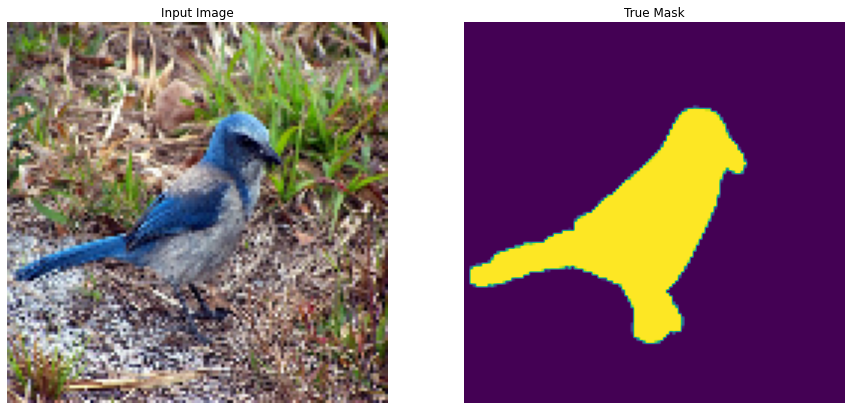

In [11]:
for image, mask in test_dataset.take(1):
    sample_image, sample_mask = image, mask
display([sample_image[1,:,:,:], sample_mask[1,:,:,:]])

In [12]:
sample_mask.numpy().min(),sample_mask.numpy().max()

(0.0, 1.0)

In [13]:
sample_mask.dtype

tf.float32

Маска может принимать всего два значения, значит выходных каналов будет 2

In [14]:
OUTPUT_CHANNELS = 2

In [15]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[128, 128, 3], include_top=False)

In [16]:
# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]

layers = [base_model.get_layer(name).output for name in layer_names]

In [17]:
# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = False

In [18]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

In [19]:
def show_predictions(model, dataset=None, num=1):
    if dataset:
        for image, mask in dataset.take(num):
            print(1)
            pred_mask = model.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])
    else:
        display([sample_image[0,:,:,:], sample_mask[0,:,:,:],
                 create_mask(model.predict(sample_image[:,:,:]))])

Создадим функцию которая будет создавать модель с разными параметрами и обучать её

In [20]:
def test_train(num_layers, optim):
    print(f"{num_layers=}")
    print(f"{optim=}")
    
    def unet_model(output_channels):
        inputs = tf.keras.layers.Input(shape=[128, 128, 3])
        x = inputs

        # Downsampling through the model
        skips = down_stack(x)
        x = skips[-1]
        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            concat = tf.keras.layers.Concatenate()
            x = concat([x, skip])

        # This is the last layer of the model
        last = tf.keras.layers.Conv2DTranspose(
          output_channels, 3, strides=2,
          padding='same')  #64x64 -> 128x128

        x = last(x)

        return tf.keras.Model(inputs=inputs, outputs=x)
    
    up_stack = [
        pix2pix.upsample(num_layers * 8, 3),  # 4x4 -> 8x8
        pix2pix.upsample(num_layers * 4, 3),  # 8x8 -> 16x16
        pix2pix.upsample(num_layers * 2, 3),  # 16x16 -> 32x32
        pix2pix.upsample(num_layers, 3),   # 32x32 -> 64x64
    ]
    
    model = unet_model(OUTPUT_CHANNELS)
    
    model.compile(optimizer=optim,
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])
    
    EPOCHS = 10
    VAL_SUBSPLITS = 5
    VALIDATION_STEPS = info.splits['test'].num_examples//10//BATCH_SIZE//VAL_SUBSPLITS

    model_history = model.fit(train_dataset, epochs=EPOCHS,
                              steps_per_epoch=STEPS_PER_EPOCH,
                              validation_steps=VALIDATION_STEPS,
                              validation_data=test_dataset)
    
    loss = model_history.history['loss']
    val_loss = model_history.history['val_loss']

    epochs = range(EPOCHS)

    plt.figure()
    plt.plot(epochs, loss, 'r', label='Training loss')
    plt.plot(epochs, val_loss, 'bo', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss Value')
    plt.ylim([0, 1])
    plt.grid('on')
    plt.legend()
    plt.show()
    
    show_predictions(model, test_dataset, 5)

In [21]:
layers = [32, 64, 128]
optims = ['SGD','RMSProp','adam','NAdam']

Запустим обучение на разных параметрах

num_layers=32
optim='SGD'
Epoch 1/10
18/18 [==============================] - 10s 366ms/step - loss: 0.5456 - accuracy: 0.7750 - val_loss: 0.4738 - val_accuracy: 0.8268
Epoch 2/10
18/18 [==============================] - 6s 320ms/step - loss: 0.4682 - accuracy: 0.8251 - val_loss: 0.4605 - val_accuracy: 0.8295
Epoch 3/10
18/18 [==============================] - 6s 308ms/step - loss: 0.4635 - accuracy: 0.8197 - val_loss: 0.4501 - val_accuracy: 0.8299
Epoch 4/10
18/18 [==============================] - 6s 338ms/step - loss: 0.4450 - accuracy: 0.8248 - val_loss: 0.4419 - val_accuracy: 0.8291
Epoch 5/10
18/18 [==============================] - 8s 422ms/step - loss: 0.4389 - accuracy: 0.8242 - val_loss: 0.4352 - val_accuracy: 0.8295
Epoch 6/10
18/18 [==============================] - 7s 407ms/step - loss: 0.4299 - accuracy: 0.8250 - val_loss: 0.4297 - val_accuracy: 0.8296
Epoch 7/10
18/18 [==============================] - 7s 399ms/step - loss: 0.4216 - accuracy: 0.8284 - val_loss: 0.4251 - 

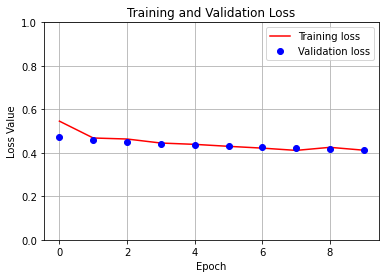

1
1/1 [==============================] - 1s 1s/step


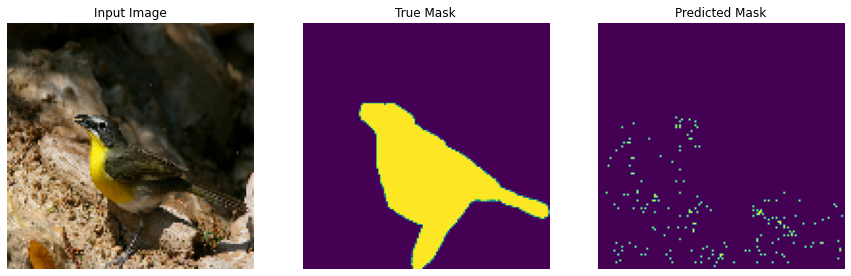

1
1/1 [==============================] - 0s 241ms/step


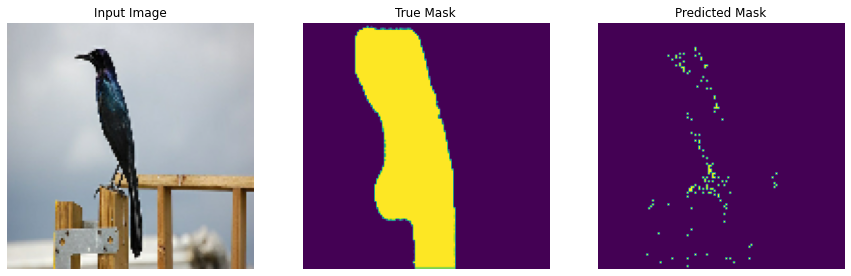

1
1/1 [==============================] - 0s 224ms/step


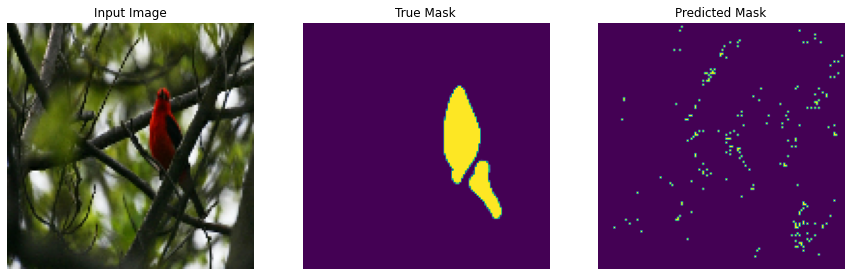

1
1/1 [==============================] - 0s 224ms/step


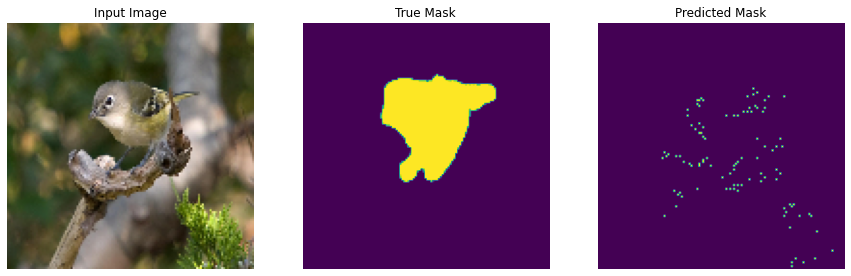

1
1/1 [==============================] - 0s 209ms/step


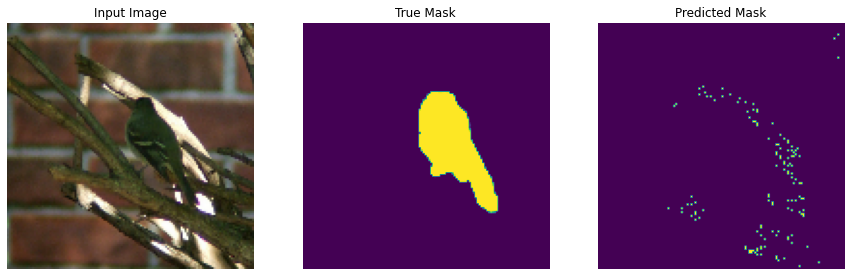

num_layers=32
optim='RMSProp'
Epoch 1/10
18/18 [==============================] - 11s 418ms/step - loss: 0.3456 - accuracy: 0.8572 - val_loss: 0.2105 - val_accuracy: 0.9223
Epoch 2/10
18/18 [==============================] - 8s 442ms/step - loss: 0.2026 - accuracy: 0.9195 - val_loss: 0.2032 - val_accuracy: 0.9245
Epoch 3/10
18/18 [==============================] - 8s 439ms/step - loss: 0.1755 - accuracy: 0.9301 - val_loss: 0.3861 - val_accuracy: 0.8725
Epoch 4/10
18/18 [==============================] - 8s 437ms/step - loss: 0.1557 - accuracy: 0.9366 - val_loss: 0.2006 - val_accuracy: 0.9266
Epoch 5/10
18/18 [==============================] - 8s 424ms/step - loss: 0.1452 - accuracy: 0.9402 - val_loss: 0.2321 - val_accuracy: 0.9198
Epoch 6/10
18/18 [==============================] - 8s 423ms/step - loss: 0.1294 - accuracy: 0.9459 - val_loss: 0.2292 - val_accuracy: 0.9265
Epoch 7/10
18/18 [==============================] - 8s 424ms/step - loss: 0.1340 - accuracy: 0.9444 - val_loss: 0.202

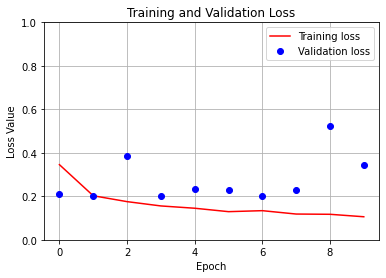

1
1/1 [==============================] - 1s 1s/step


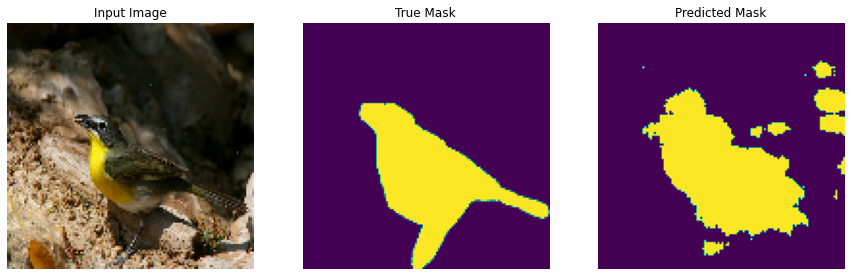

1
1/1 [==============================] - 0s 204ms/step


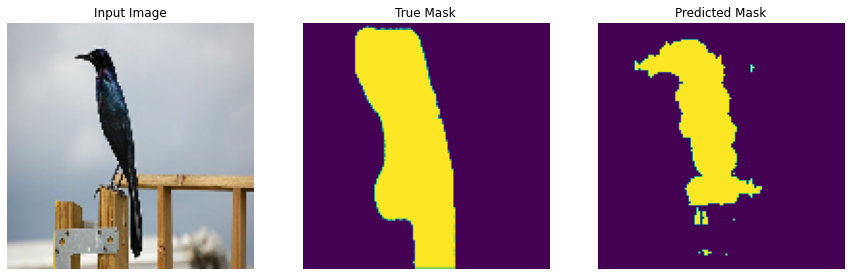

1
1/1 [==============================] - 0s 210ms/step


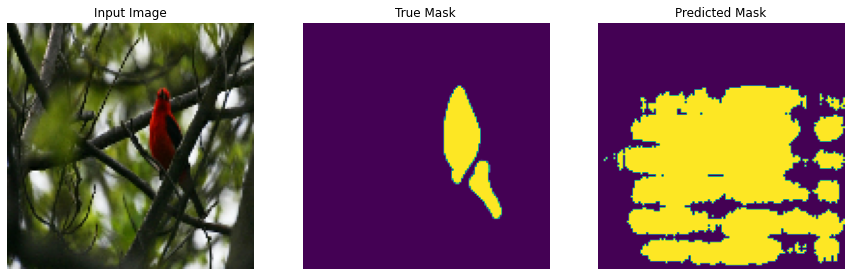

1
1/1 [==============================] - 0s 233ms/step


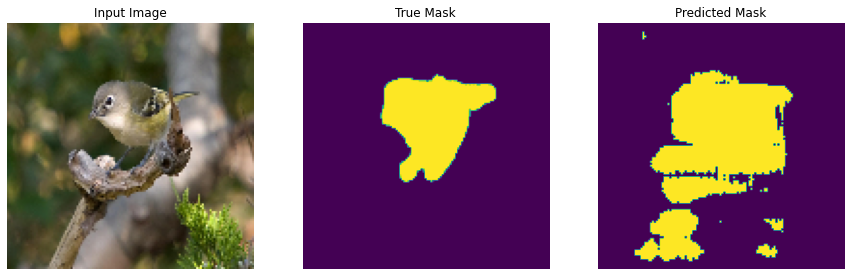

1
1/1 [==============================] - 0s 279ms/step


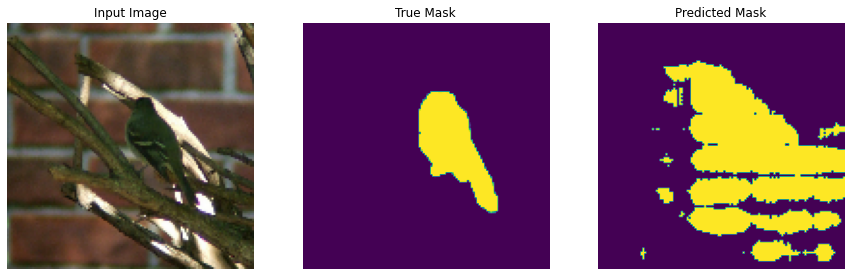

num_layers=32
optim='adam'
Epoch 1/10
18/18 [==============================] - 11s 432ms/step - loss: 0.5233 - accuracy: 0.7622 - val_loss: 0.3529 - val_accuracy: 0.8612
Epoch 2/10
18/18 [==============================] - 8s 463ms/step - loss: 0.2716 - accuracy: 0.8847 - val_loss: 0.2940 - val_accuracy: 0.9014
Epoch 3/10
18/18 [==============================] - 8s 471ms/step - loss: 0.1928 - accuracy: 0.9279 - val_loss: 0.3082 - val_accuracy: 0.8917
Epoch 4/10
18/18 [==============================] - 8s 462ms/step - loss: 0.1589 - accuracy: 0.9387 - val_loss: 0.2605 - val_accuracy: 0.9013
Epoch 5/10
18/18 [==============================] - 9s 479ms/step - loss: 0.1381 - accuracy: 0.9467 - val_loss: 0.2363 - val_accuracy: 0.9092
Epoch 6/10
18/18 [==============================] - 8s 448ms/step - loss: 0.1238 - accuracy: 0.9512 - val_loss: 0.1790 - val_accuracy: 0.9289
Epoch 7/10
18/18 [==============================] - 8s 458ms/step - loss: 0.1172 - accuracy: 0.9529 - val_loss: 0.1713 -

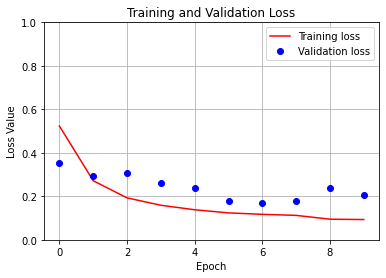

1
1/1 [==============================] - 1s 1s/step


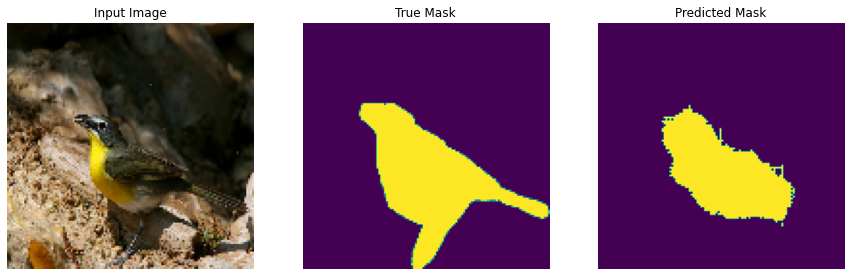

1
1/1 [==============================] - 0s 223ms/step


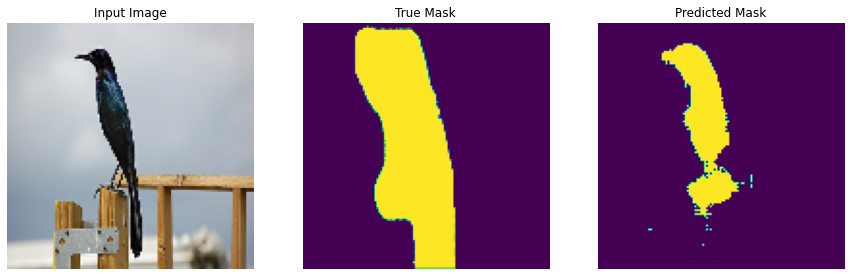

1
1/1 [==============================] - 0s 250ms/step


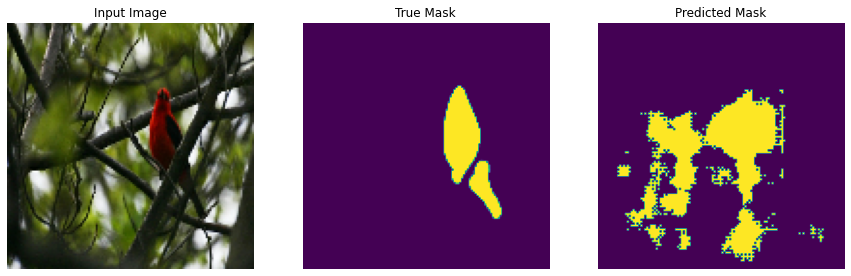

1
1/1 [==============================] - 0s 256ms/step


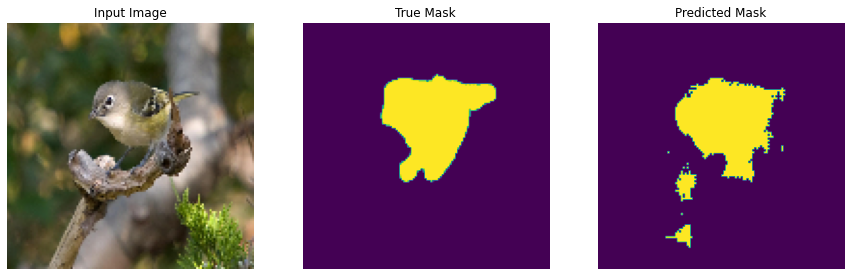

1
1/1 [==============================] - 0s 254ms/step


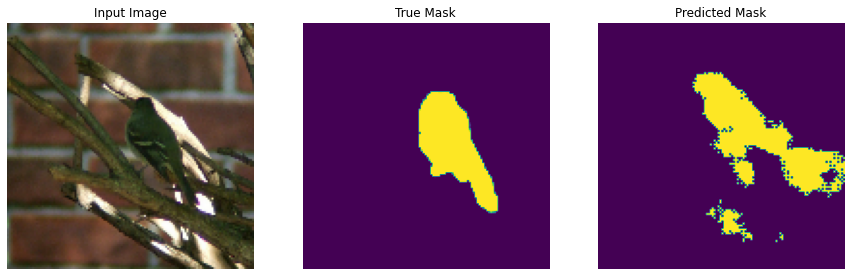

num_layers=32
optim='NAdam'
Epoch 1/10
18/18 [==============================] - 10s 337ms/step - loss: 0.4061 - accuracy: 0.8174 - val_loss: 0.2987 - val_accuracy: 0.8672
Epoch 2/10
18/18 [==============================] - 6s 328ms/step - loss: 0.2111 - accuracy: 0.9176 - val_loss: 0.2320 - val_accuracy: 0.9043
Epoch 3/10
18/18 [==============================] - 6s 315ms/step - loss: 0.1785 - accuracy: 0.9292 - val_loss: 0.1799 - val_accuracy: 0.9301
Epoch 4/10
18/18 [==============================] - 6s 326ms/step - loss: 0.1459 - accuracy: 0.9419 - val_loss: 0.1857 - val_accuracy: 0.9245
Epoch 5/10
18/18 [==============================] - 6s 321ms/step - loss: 0.1345 - accuracy: 0.9446 - val_loss: 0.1841 - val_accuracy: 0.9276
Epoch 6/10
18/18 [==============================] - 6s 338ms/step - loss: 0.1301 - accuracy: 0.9470 - val_loss: 0.1805 - val_accuracy: 0.9274
Epoch 7/10
18/18 [==============================] - 6s 344ms/step - loss: 0.1091 - accuracy: 0.9551 - val_loss: 0.1761 

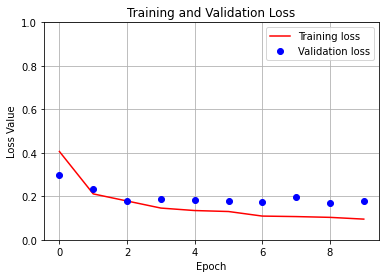

1
1/1 [==============================] - 1s 1s/step


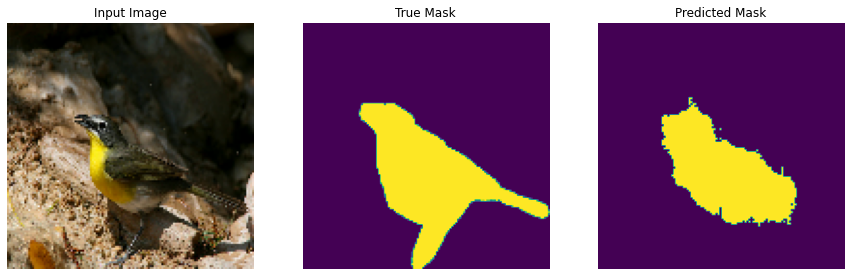

1
1/1 [==============================] - 0s 264ms/step


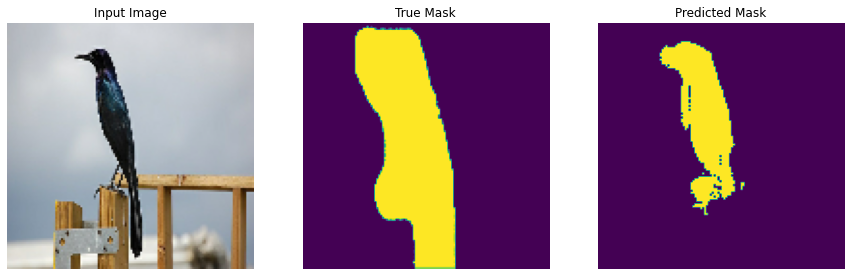

1
1/1 [==============================] - 0s 258ms/step


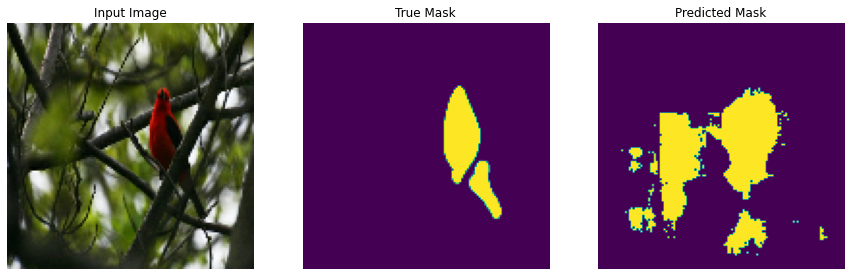

1
1/1 [==============================] - 0s 254ms/step


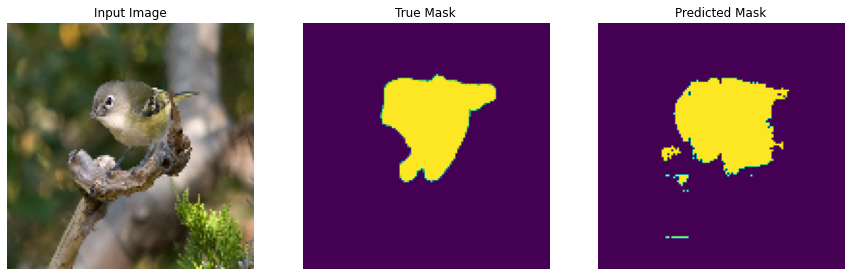

1
1/1 [==============================] - 0s 252ms/step


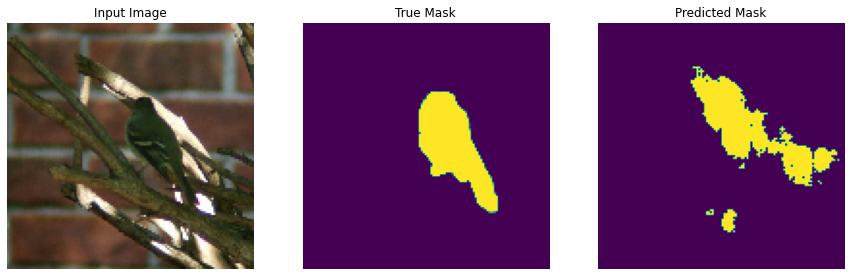

num_layers=64
optim='SGD'
Epoch 1/10
18/18 [==============================] - 13s 587ms/step - loss: 0.5076 - accuracy: 0.8008 - val_loss: 0.4643 - val_accuracy: 0.8265
Epoch 2/10
18/18 [==============================] - 9s 527ms/step - loss: 0.4596 - accuracy: 0.8280 - val_loss: 0.4545 - val_accuracy: 0.8258
Epoch 3/10
18/18 [==============================] - 12s 706ms/step - loss: 0.4515 - accuracy: 0.8242 - val_loss: 0.4450 - val_accuracy: 0.8261
Epoch 4/10
18/18 [==============================] - 13s 756ms/step - loss: 0.4503 - accuracy: 0.8189 - val_loss: 0.4386 - val_accuracy: 0.8255
Epoch 5/10
18/18 [==============================] - 13s 721ms/step - loss: 0.4353 - accuracy: 0.8259 - val_loss: 0.4322 - val_accuracy: 0.8271
Epoch 6/10
18/18 [==============================] - 14s 774ms/step - loss: 0.4283 - accuracy: 0.8253 - val_loss: 0.4289 - val_accuracy: 0.8256
Epoch 7/10
18/18 [==============================] - 14s 780ms/step - loss: 0.4225 - accuracy: 0.8261 - val_loss: 0.42

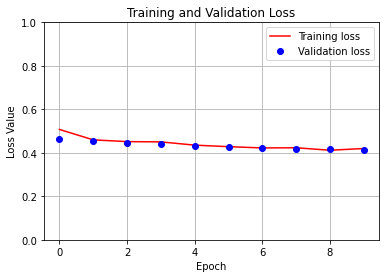

1
1/1 [==============================] - 1s 1s/step


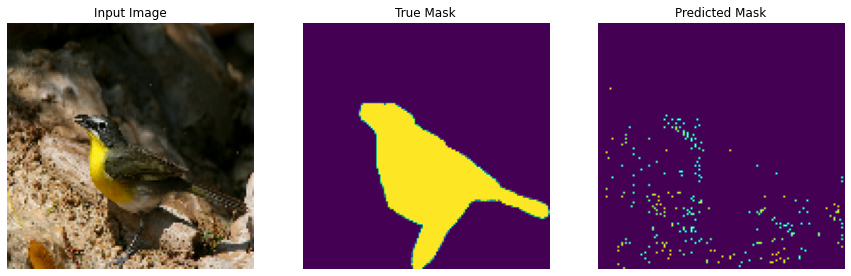

1
1/1 [==============================] - 0s 283ms/step


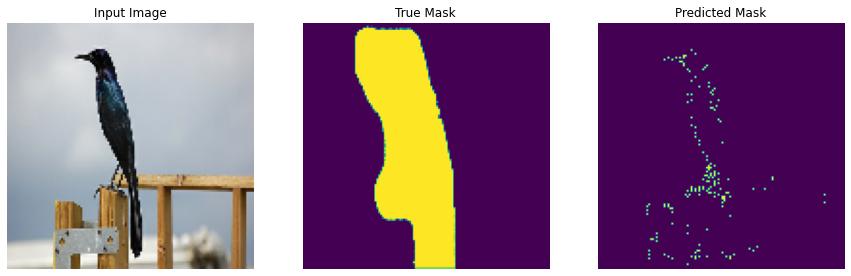

1
1/1 [==============================] - 0s 296ms/step


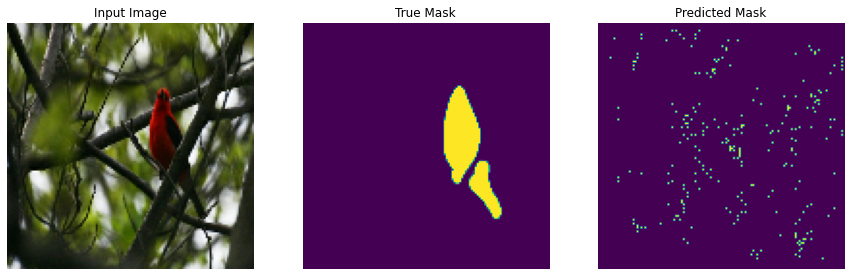

1
1/1 [==============================] - 0s 366ms/step


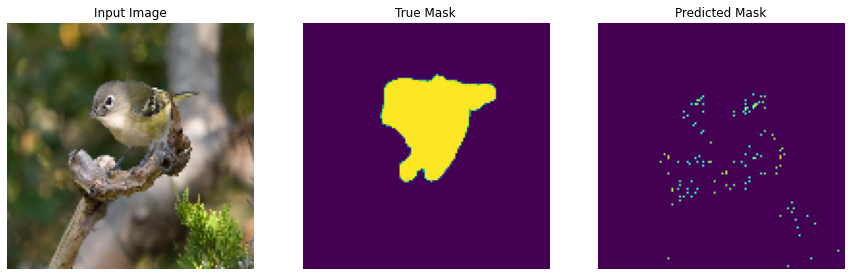

1
1/1 [==============================] - 0s 353ms/step


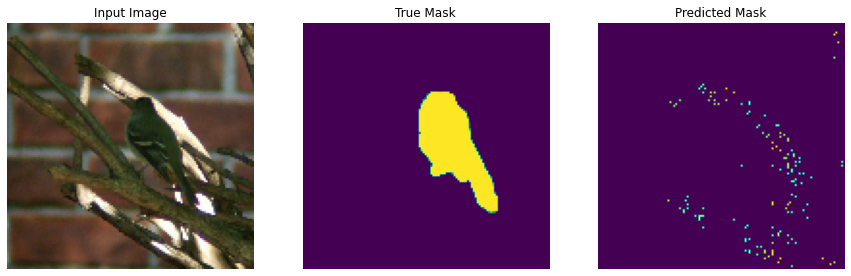

num_layers=64
optim='RMSProp'
Epoch 1/10
18/18 [==============================] - 21s 989ms/step - loss: 0.3095 - accuracy: 0.8718 - val_loss: 0.8541 - val_accuracy: 0.7399
Epoch 2/10
18/18 [==============================] - 15s 856ms/step - loss: 0.1888 - accuracy: 0.9227 - val_loss: 0.3090 - val_accuracy: 0.8966
Epoch 3/10
18/18 [==============================] - 14s 776ms/step - loss: 0.1749 - accuracy: 0.9275 - val_loss: 0.3355 - val_accuracy: 0.8981
Epoch 4/10
18/18 [==============================] - 13s 754ms/step - loss: 0.1630 - accuracy: 0.9330 - val_loss: 0.3375 - val_accuracy: 0.8933
Epoch 5/10
18/18 [==============================] - 13s 750ms/step - loss: 0.1484 - accuracy: 0.9376 - val_loss: 0.2290 - val_accuracy: 0.9238
Epoch 6/10
18/18 [==============================] - 14s 791ms/step - loss: 0.1322 - accuracy: 0.9443 - val_loss: 0.2241 - val_accuracy: 0.9274
Epoch 7/10
18/18 [==============================] - 14s 777ms/step - loss: 0.1247 - accuracy: 0.9470 - val_loss:

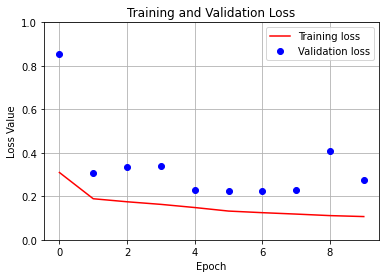

1
1/1 [==============================] - 1s 1s/step


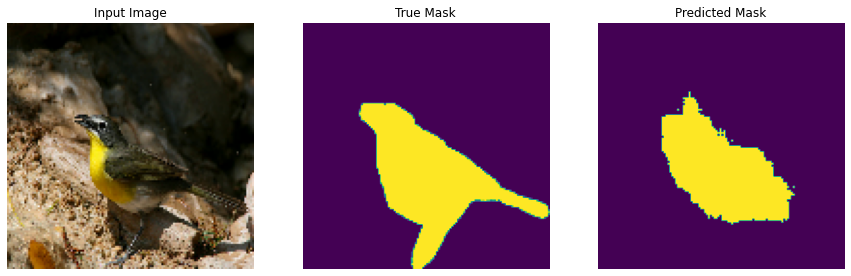

1
1/1 [==============================] - 0s 333ms/step


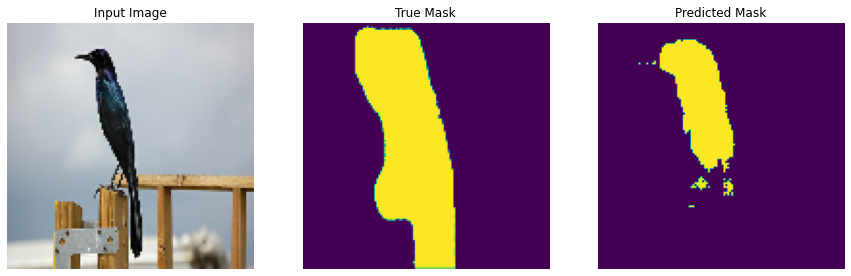

1
1/1 [==============================] - 0s 331ms/step


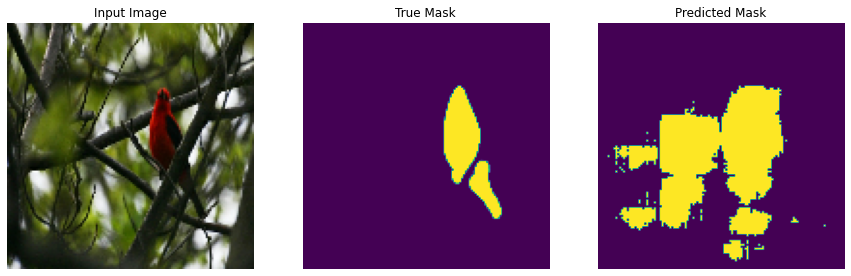

1
1/1 [==============================] - 0s 278ms/step


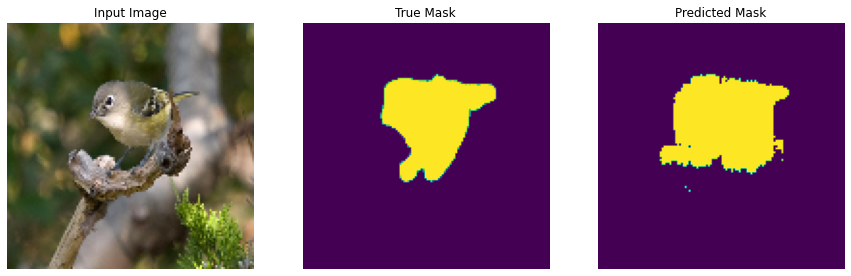

1
1/1 [==============================] - 0s 358ms/step


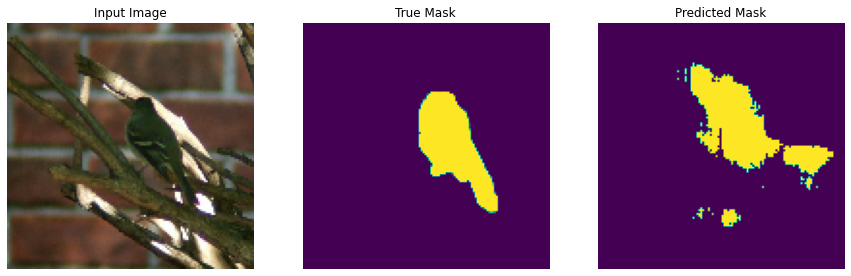

num_layers=64
optim='adam'
Epoch 1/10
18/18 [==============================] - 18s 828ms/step - loss: 0.3979 - accuracy: 0.8135 - val_loss: 0.7248 - val_accuracy: 0.7449
Epoch 2/10
18/18 [==============================] - 14s 782ms/step - loss: 0.1983 - accuracy: 0.9182 - val_loss: 0.7861 - val_accuracy: 0.7906
Epoch 3/10
18/18 [==============================] - 14s 776ms/step - loss: 0.1640 - accuracy: 0.9350 - val_loss: 1.1140 - val_accuracy: 0.7017
Epoch 4/10
18/18 [==============================] - 13s 726ms/step - loss: 0.1439 - accuracy: 0.9410 - val_loss: 0.8269 - val_accuracy: 0.7536
Epoch 5/10
18/18 [==============================] - 13s 743ms/step - loss: 0.1321 - accuracy: 0.9458 - val_loss: 0.5880 - val_accuracy: 0.8060
Epoch 6/10
18/18 [==============================] - 15s 860ms/step - loss: 0.1147 - accuracy: 0.9525 - val_loss: 0.4607 - val_accuracy: 0.8458
Epoch 7/10
18/18 [==============================] - 13s 751ms/step - loss: 0.1175 - accuracy: 0.9504 - val_loss: 0.

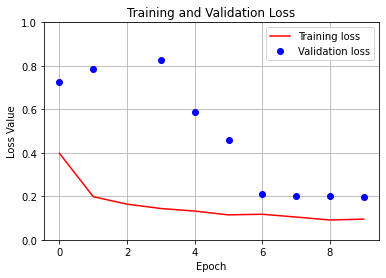

1
1/1 [==============================] - 1s 1s/step


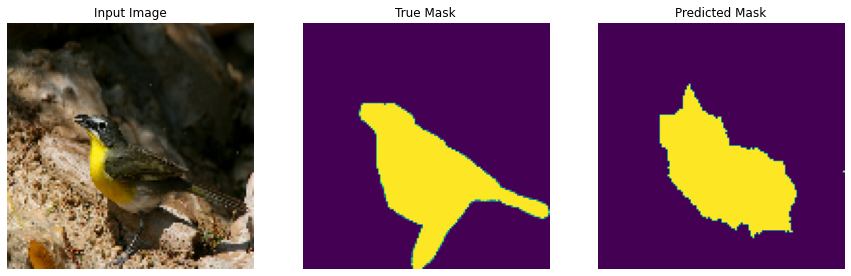

1
1/1 [==============================] - 0s 328ms/step


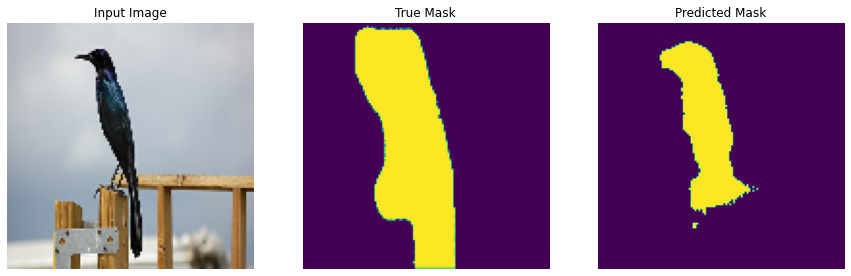

1
1/1 [==============================] - 0s 321ms/step


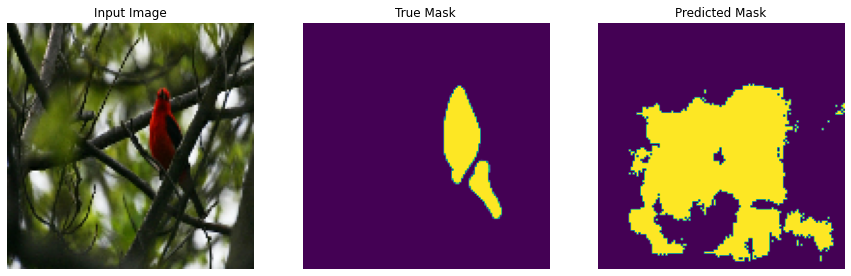

1
1/1 [==============================] - 0s 382ms/step


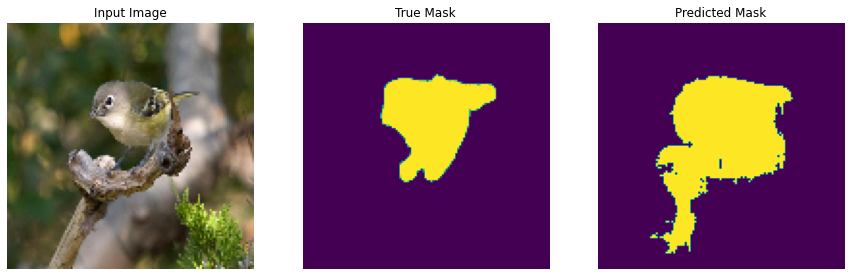

1
1/1 [==============================] - 0s 388ms/step


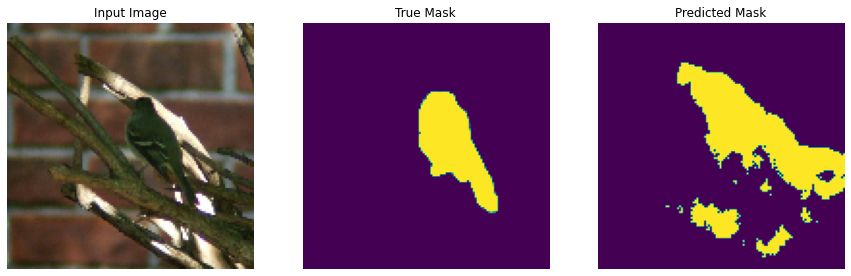

num_layers=64
optim='NAdam'
Epoch 1/10
18/18 [==============================] - 18s 781ms/step - loss: 0.3606 - accuracy: 0.8439 - val_loss: 0.3035 - val_accuracy: 0.8901
Epoch 2/10
18/18 [==============================] - 14s 789ms/step - loss: 0.1939 - accuracy: 0.9223 - val_loss: 0.2526 - val_accuracy: 0.9036
Epoch 3/10
18/18 [==============================] - 15s 843ms/step - loss: 0.1625 - accuracy: 0.9334 - val_loss: 0.2599 - val_accuracy: 0.8990
Epoch 4/10
18/18 [==============================] - 14s 786ms/step - loss: 0.1489 - accuracy: 0.9385 - val_loss: 0.2100 - val_accuracy: 0.9177
Epoch 5/10
18/18 [==============================] - 15s 858ms/step - loss: 0.1337 - accuracy: 0.9447 - val_loss: 0.2187 - val_accuracy: 0.9171
Epoch 6/10
18/18 [==============================] - 13s 751ms/step - loss: 0.1235 - accuracy: 0.9482 - val_loss: 0.2735 - val_accuracy: 0.8981
Epoch 7/10
18/18 [==============================] - 14s 766ms/step - loss: 0.1144 - accuracy: 0.9512 - val_loss: 0

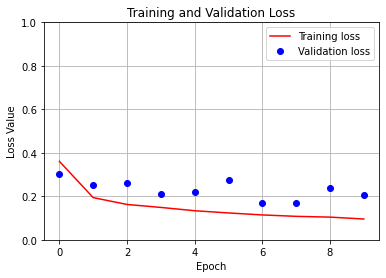

1
1/1 [==============================] - 2s 2s/step


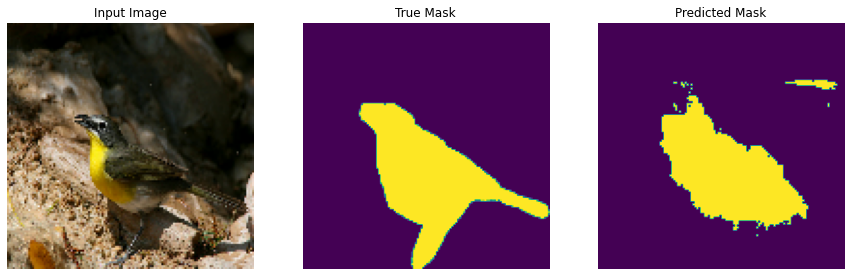

1
1/1 [==============================] - 0s 367ms/step


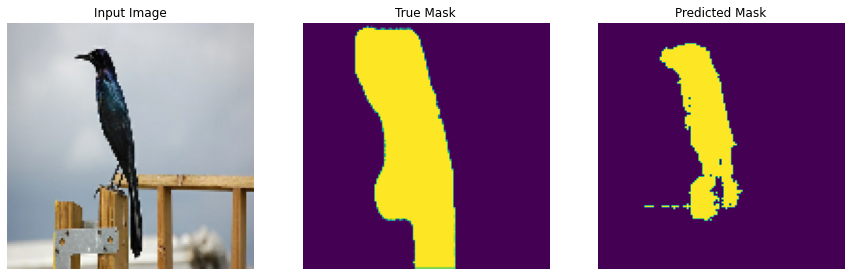

1
1/1 [==============================] - 0s 336ms/step


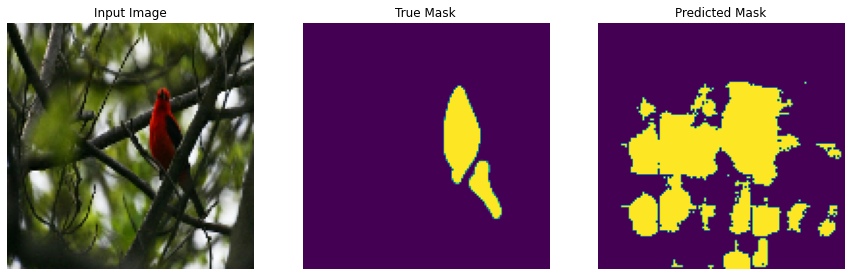

1
1/1 [==============================] - 0s 379ms/step


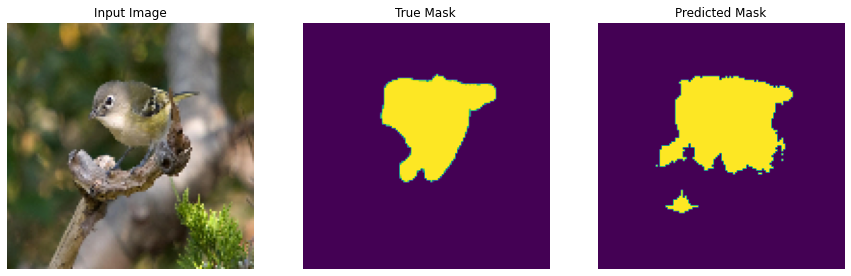

1
1/1 [==============================] - 0s 385ms/step


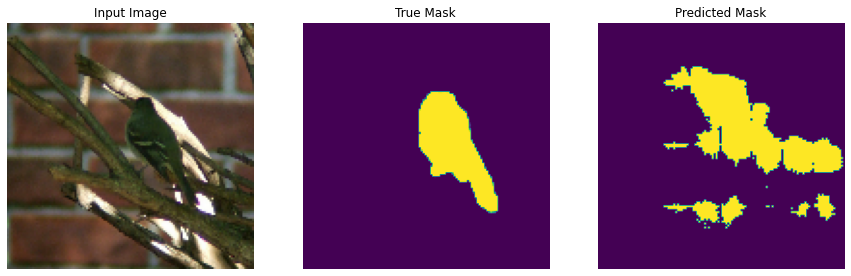

num_layers=128
optim='SGD'
Epoch 1/10
18/18 [==============================] - 34s 2s/step - loss: 0.5058 - accuracy: 0.8052 - val_loss: 0.4584 - val_accuracy: 0.8294
Epoch 2/10
18/18 [==============================] - 23s 1s/step - loss: 0.4634 - accuracy: 0.8219 - val_loss: 0.4459 - val_accuracy: 0.8298
Epoch 3/10
18/18 [==============================] - 19s 1s/step - loss: 0.4402 - accuracy: 0.8286 - val_loss: 0.4360 - val_accuracy: 0.8309
Epoch 4/10
18/18 [==============================] - 19s 1s/step - loss: 0.4363 - accuracy: 0.8257 - val_loss: 0.4303 - val_accuracy: 0.8295
Epoch 5/10
18/18 [==============================] - 18s 1s/step - loss: 0.4179 - accuracy: 0.8310 - val_loss: 0.4242 - val_accuracy: 0.8292
Epoch 6/10
18/18 [==============================] - 19s 1s/step - loss: 0.4305 - accuracy: 0.8200 - val_loss: 0.4199 - val_accuracy: 0.8288
Epoch 7/10
18/18 [==============================] - 20s 1s/step - loss: 0.4064 - accuracy: 0.8322 - val_loss: 0.4135 - val_accuracy: 

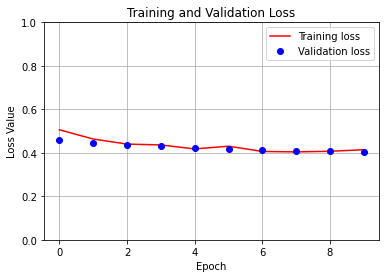

1
1/1 [==============================] - 2s 2s/step


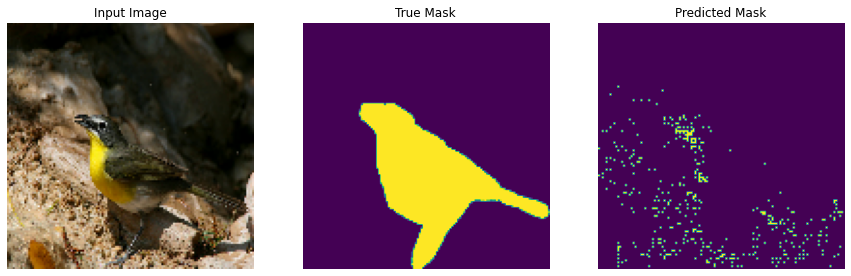

1
1/1 [==============================] - 0s 471ms/step


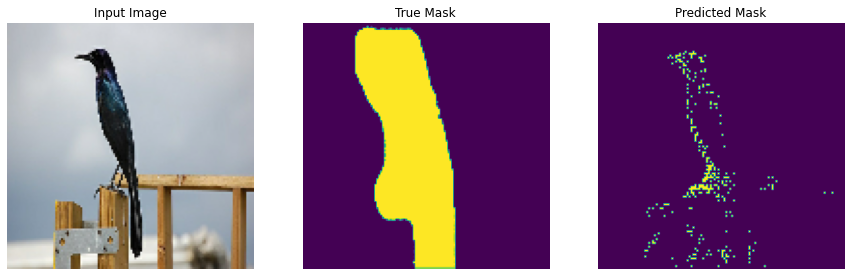

1
1/1 [==============================] - 0s 468ms/step


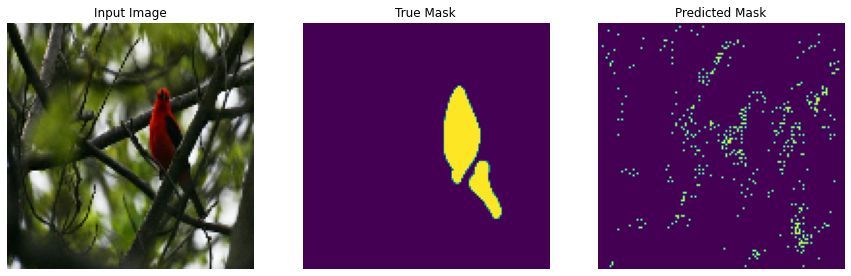

1
1/1 [==============================] - 0s 454ms/step


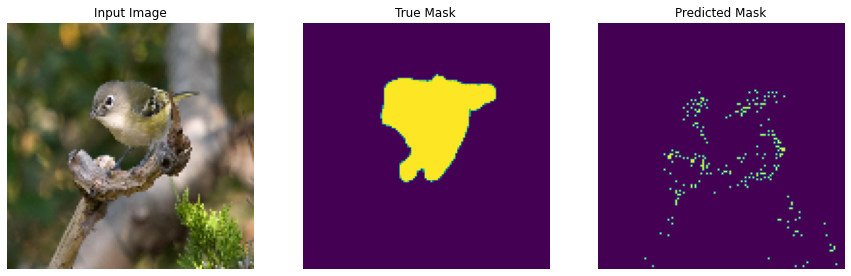

1
1/1 [==============================] - 0s 446ms/step


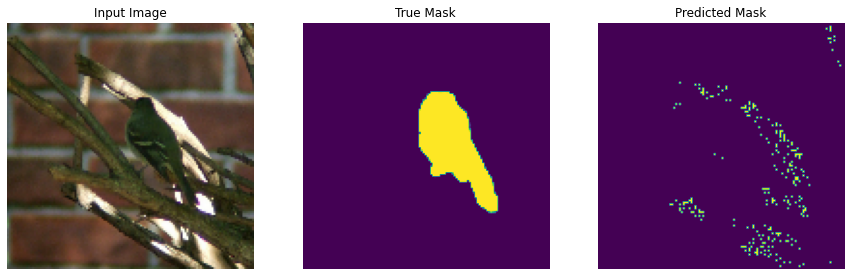

num_layers=128
optim='RMSProp'
Epoch 1/10
18/18 [==============================] - 27s 1s/step - loss: 0.3143 - accuracy: 0.8716 - val_loss: 2.8055 - val_accuracy: 0.4738
Epoch 2/10
18/18 [==============================] - 23s 1s/step - loss: 0.1982 - accuracy: 0.9177 - val_loss: 1.7228 - val_accuracy: 0.6793
Epoch 3/10
18/18 [==============================] - 23s 1s/step - loss: 0.1720 - accuracy: 0.9288 - val_loss: 1.0286 - val_accuracy: 0.7537
Epoch 4/10
18/18 [==============================] - 24s 1s/step - loss: 0.1688 - accuracy: 0.9299 - val_loss: 0.5783 - val_accuracy: 0.8541
Epoch 5/10
18/18 [==============================] - 24s 1s/step - loss: 0.1508 - accuracy: 0.9357 - val_loss: 0.2405 - val_accuracy: 0.9286
Epoch 6/10
18/18 [==============================] - 24s 1s/step - loss: 0.1493 - accuracy: 0.9374 - val_loss: 0.3614 - val_accuracy: 0.9000
Epoch 7/10
18/18 [==============================] - 24s 1s/step - loss: 0.1384 - accuracy: 0.9409 - val_loss: 0.3680 - val_accura

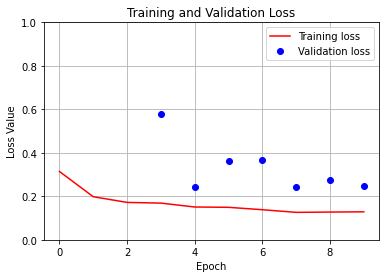

1
1/1 [==============================] - 1s 1s/step


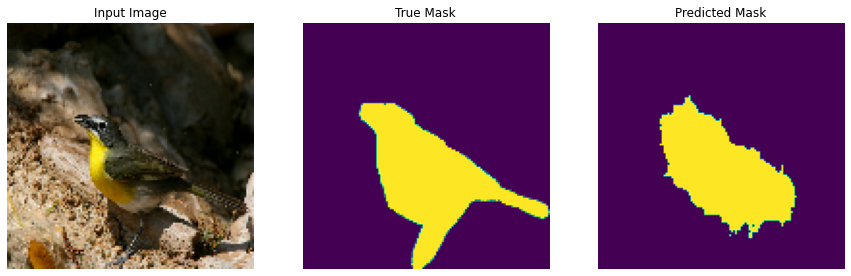

1
1/1 [==============================] - 1s 570ms/step


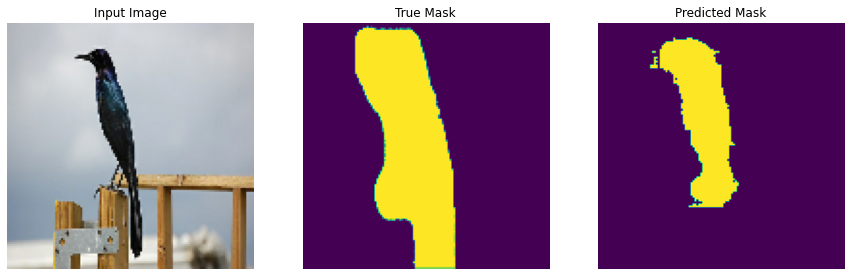

1
1/1 [==============================] - 1s 586ms/step


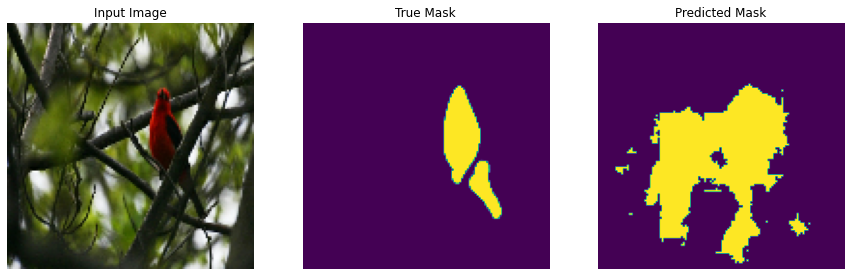

1
1/1 [==============================] - 1s 593ms/step


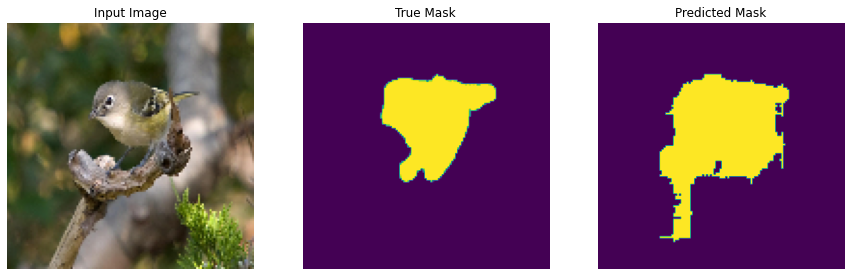

1
1/1 [==============================] - 1s 601ms/step


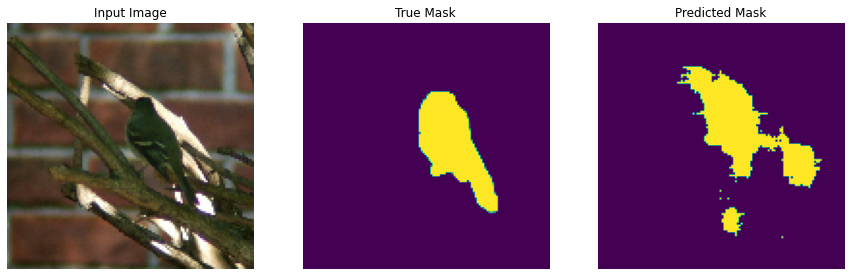

num_layers=128
optim='adam'
Epoch 1/10
18/18 [==============================] - 30s 2s/step - loss: 0.3759 - accuracy: 0.8276 - val_loss: 1.6826 - val_accuracy: 0.5455
Epoch 2/10
18/18 [==============================] - 27s 2s/step - loss: 0.1853 - accuracy: 0.9249 - val_loss: 2.4868 - val_accuracy: 0.5585
Epoch 3/10
18/18 [==============================] - 28s 2s/step - loss: 0.1616 - accuracy: 0.9341 - val_loss: 1.7494 - val_accuracy: 0.6019
Epoch 4/10
18/18 [==============================] - 27s 2s/step - loss: 0.1425 - accuracy: 0.9405 - val_loss: 1.5097 - val_accuracy: 0.6252
Epoch 5/10
18/18 [==============================] - 28s 2s/step - loss: 0.1243 - accuracy: 0.9479 - val_loss: 0.6406 - val_accuracy: 0.7971
Epoch 6/10
18/18 [==============================] - 29s 2s/step - loss: 0.1304 - accuracy: 0.9449 - val_loss: 0.8327 - val_accuracy: 0.7360
Epoch 7/10
18/18 [==============================] - 29s 2s/step - loss: 0.1142 - accuracy: 0.9522 - val_loss: 0.4907 - val_accuracy:

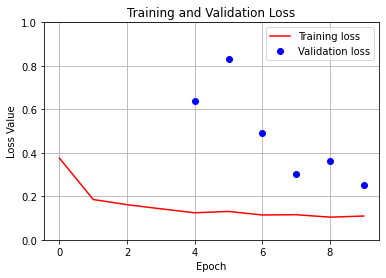

1
1/1 [==============================] - 2s 2s/step


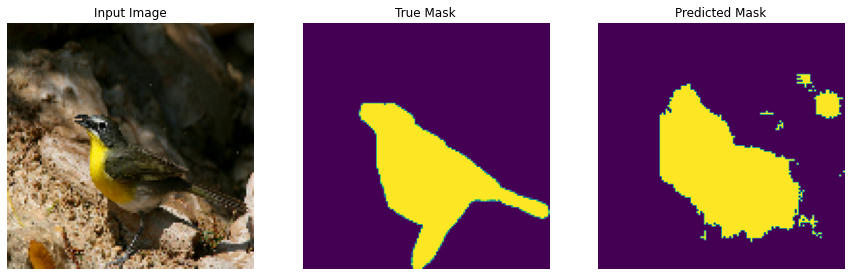

1
1/1 [==============================] - 1s 646ms/step


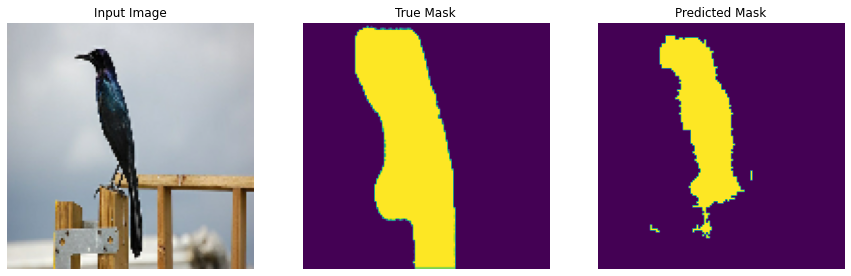

1
1/1 [==============================] - 1s 694ms/step


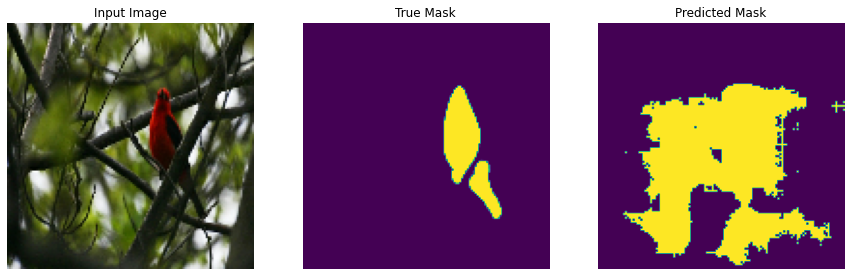

1
1/1 [==============================] - 1s 623ms/step


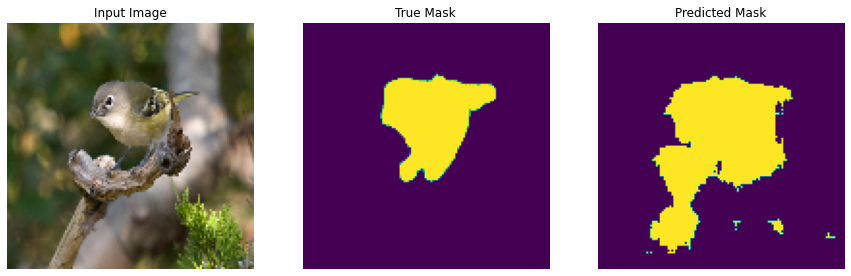

1
1/1 [==============================] - 1s 659ms/step


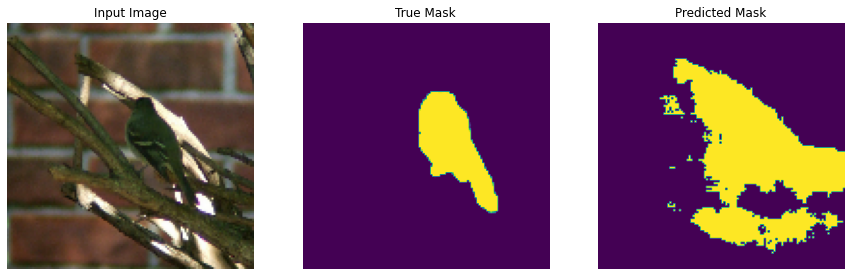

num_layers=128
optim='NAdam'
Epoch 1/10
18/18 [==============================] - 40s 2s/step - loss: 0.3628 - accuracy: 0.8342 - val_loss: 0.4722 - val_accuracy: 0.8045
Epoch 2/10
18/18 [==============================] - 32s 2s/step - loss: 0.1887 - accuracy: 0.9230 - val_loss: 0.4810 - val_accuracy: 0.8372
Epoch 3/10
18/18 [==============================] - 29s 2s/step - loss: 0.1564 - accuracy: 0.9358 - val_loss: 0.4883 - val_accuracy: 0.8250
Epoch 4/10
18/18 [==============================] - 28s 2s/step - loss: 0.1425 - accuracy: 0.9405 - val_loss: 0.4284 - val_accuracy: 0.8388
Epoch 5/10
18/18 [==============================] - 27s 2s/step - loss: 0.1415 - accuracy: 0.9401 - val_loss: 0.1850 - val_accuracy: 0.9311
Epoch 6/10
18/18 [==============================] - 31s 2s/step - loss: 0.1229 - accuracy: 0.9479 - val_loss: 0.2964 - val_accuracy: 0.8915
Epoch 7/10
18/18 [==============================] - 25s 1s/step - loss: 0.1221 - accuracy: 0.9477 - val_loss: 0.1982 - val_accuracy

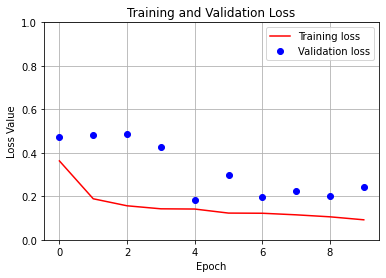

1
1/1 [==============================] - 2s 2s/step


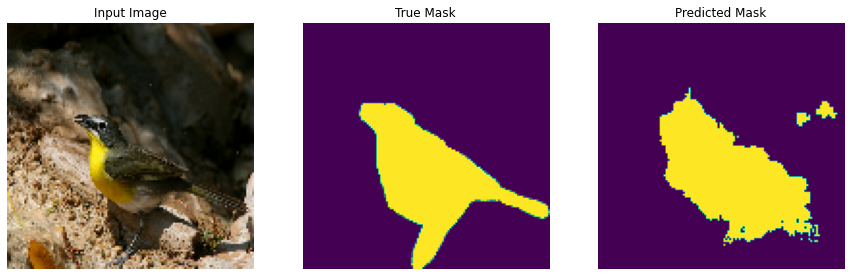

1
1/1 [==============================] - 1s 907ms/step


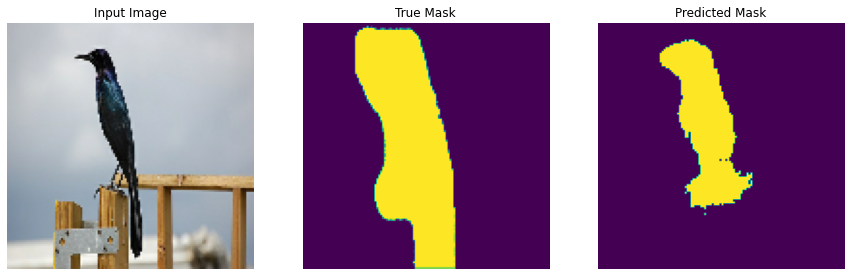

1
1/1 [==============================] - 1s 815ms/step


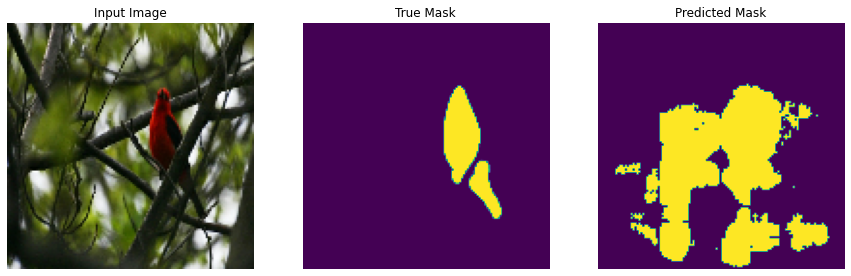

1
1/1 [==============================] - 1s 866ms/step


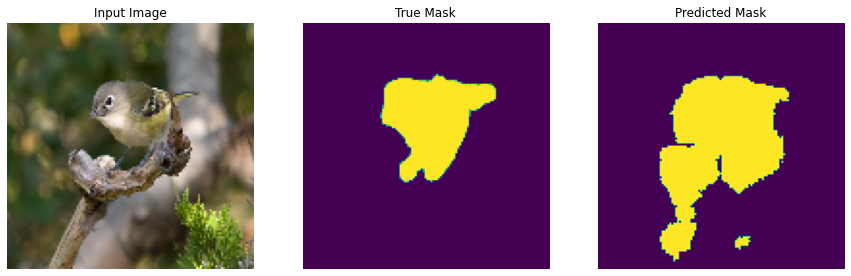

1
1/1 [==============================] - 1s 857ms/step


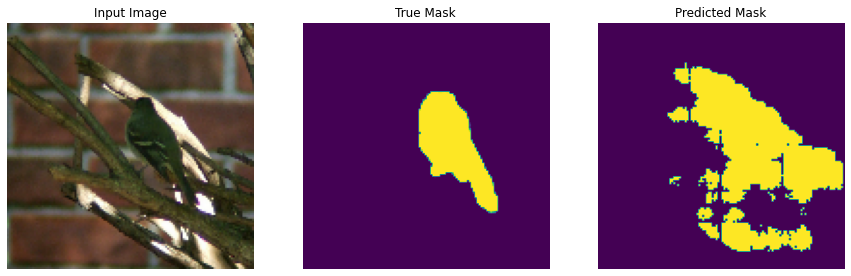

In [22]:
for layer in layers:
    for optim in optims:
        test_train(layer, optim)

Основные выводы:
- оптимизатор SGD не лучший вариант, в этой задаче его лучше не использовать
- образы птиц определяются более менее если на изображении нет листьев и веток, в ином случае всё очень плохо, пока не знаю как бороться
- по моему мнению лучше всего справляется модель с num_layers = 64 и оптимизаторами Adam и NAdam


Я не видимо не до конца разобрался в данной теме, если будет не сложно напишите на что мне стоит обратить внимание для улучшения качества модели и возможно на ошибки какие я тут допустил